In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
combined_data = pd.read_csv('data/combined_data/combined_data.csv')

In [3]:
combined_data.head()

,T,TM,Tm,H,PP,VV,V,VM,PM_2_5
0,24.2,32,21.9,71,2.54,6.9,0.2,1.9,54.0
1,24.9,29.6,21.6,71,0.25,6.9,1.9,3.5,93.0
2,24.9,31.2,22.2,77,0,6.3,3.1,7.6,64.0
3,24.8,32,20.2,78,0,6.3,4.6,11.1,72.0
4,26.3,33,19.1,76,39.12,6.9,5.2,7.6,74.0


In [4]:
combined_data.dtypes

T          object
TM         object
Tm         object
H          object
PP         object
VV         object
V          object
VM         object
PM_2_5    float64
dtype: object

In [5]:
for col in combined_data.columns[:-1]:
    combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

In [6]:
combined_data.dtypes

T         float64
TM        float64
Tm        float64
H         float64
PP        float64
VV        float64
V         float64
VM        float64
PM_2_5    float64
dtype: object

In [7]:
combined_data.head()

,T,TM,Tm,H,PP,VV,V,VM,PM_2_5
0,24.2,32.0,21.9,71.0,2.54,6.9,0.2,1.9,54.0
1,24.9,29.6,21.6,71.0,0.25,6.9,1.9,3.5,93.0
2,24.9,31.2,22.2,77.0,0.00,6.3,3.1,7.6,64.0
3,24.8,32.0,20.2,78.0,0.00,6.3,4.6,11.1,72.0
4,26.3,33.0,19.1,76.0,39.12,6.9,5.2,7.6,74.0


In [8]:
combined_data.isna().sum()

T         14
TM        14
Tm        14
H         14
PP        54
VV        14
V         14
VM        21
PM_2_5     0
dtype: int64

<AxesSubplot:>

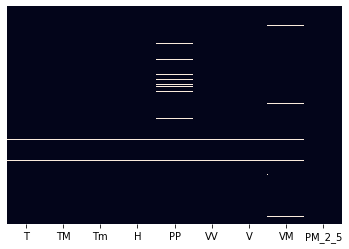

In [9]:
sns.heatmap(combined_data.isna(), yticklabels=False, cbar=False)

In [12]:
combined_data = combined_data.dropna()

<AxesSubplot:>

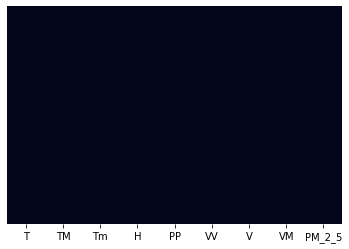

In [13]:
sns.heatmap(combined_data.isna(), yticklabels=False, cbar=False)

In [14]:
combined_data.shape

(904, 9)

In [15]:
combined_data['PM_2_5'].value_counts()

71.0     18
68.0     16
91.0     16
72.0     15
59.0     14
         ..
230.0     1
171.0     1
139.0     1
144.0     1
3.0       1
Name: PM_2_5, Length: 154, dtype: int64

In [16]:
# Drop rows where PM2.5 is 0.0
combined_data = combined_data[combined_data['PM_2_5'] != 0.0]

In [17]:
combined_data.head()

,T,TM,Tm,H,PP,VV,V,VM,PM_2_5
0,24.2,32.0,21.9,71.0,2.54,6.9,0.2,1.9,54.0
1,24.9,29.6,21.6,71.0,0.25,6.9,1.9,3.5,93.0
2,24.9,31.2,22.2,77.0,0.00,6.3,3.1,7.6,64.0
3,24.8,32.0,20.2,78.0,0.00,6.3,4.6,11.1,72.0
4,26.3,33.0,19.1,76.0,39.12,6.9,5.2,7.6,74.0


In [18]:
combined_data.shape

(904, 9)

In [19]:
X = combined_data.iloc[:, :-1]
y = combined_data.iloc[:, -1]

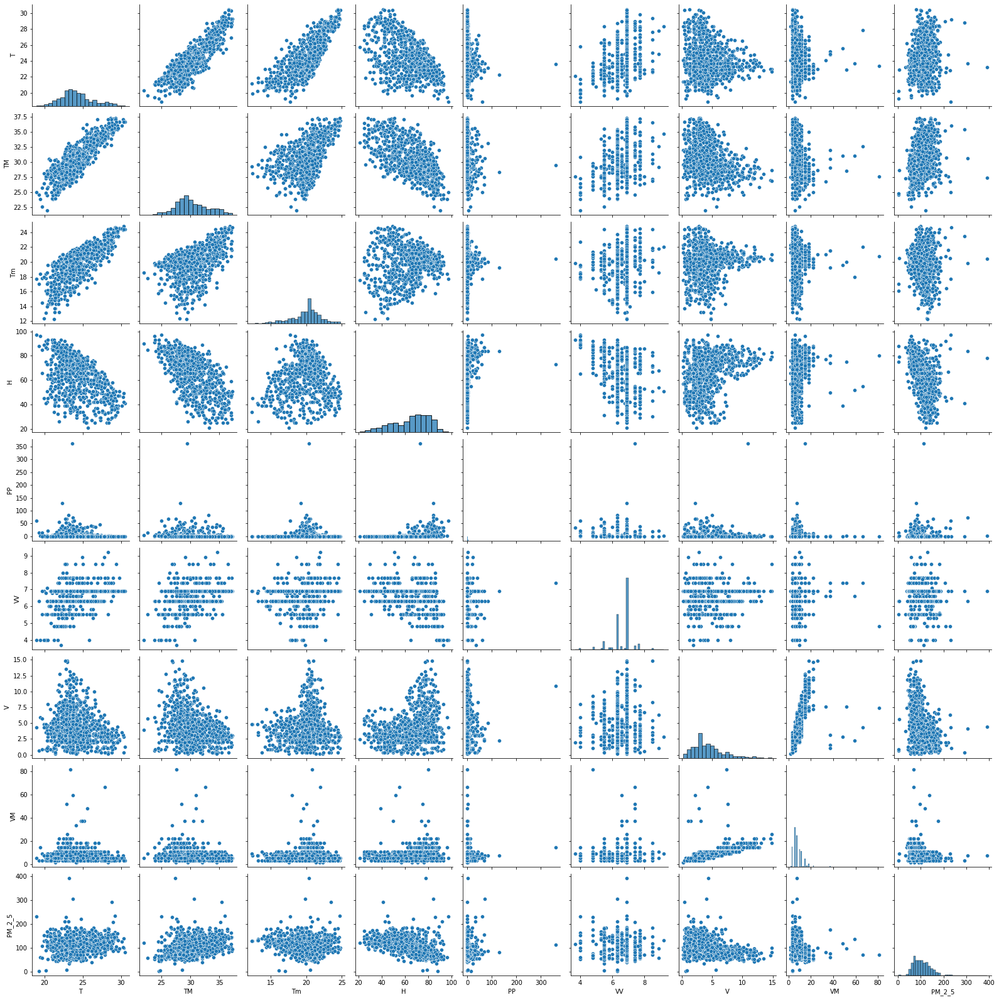

In [20]:
sns.pairplot(combined_data)

In [21]:
combined_data.corr()

,T,TM,Tm,H,PP,VV,V,VM,PM_2_5
T,1.000000,0.857467,0.726497,-0.485411,-0.081301,0.348899,-0.171083,-0.075123,0.195628
TM,0.857467,1.000000,0.444116,-0.648606,-0.065273,0.287214,-0.304626,-0.174857,0.347140
Tm,0.726497,0.444116,1.000000,0.165108,0.024262,0.143020,0.092118,0.078780,-0.139056
H,-0.485411,-0.648606,0.165108,1.000000,0.205944,-0.296499,0.338367,0.201946,-0.511302
PP,-0.081301,-0.065273,0.024262,0.205944,1.000000,-0.055667,0.029077,0.004797,-0.024802
VV,0.348899,0.287214,0.143020,-0.296499,-0.055667,1.000000,0.030183,0.008585,-0.015020
V,-0.171083,-0.304626,0.092118,0.338367,0.029077,0.030183,1.000000,0.567373,-0.380709
VM,-0.075123,-0.174857,0.078780,0.201946,0.004797,0.008585,0.567373,1.000000,-0.255961
PM_2_5,0.195628,0.347140,-0.139056,-0.511302,-0.024802,-0.015020,-0.380709,-0.255961,1.000000


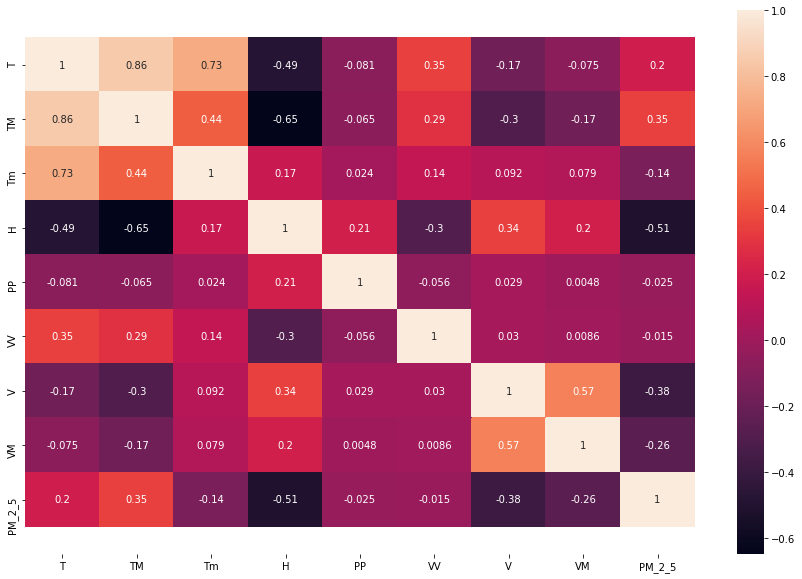

In [22]:
plt.figure(figsize=(15, 10))
ax = sns.heatmap(combined_data.corr(), annot=True)
# need this since due to bug in current version of matplotlib and seaborn
# top and bottom rows are cut in half
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5);

In [23]:
from sklearn.ensemble import ExtraTreesRegressor
feature_selector = ExtraTreesRegressor()
feature_selector.fit(X,y)

ExtraTreesRegressor()

In [24]:
feature_selector.feature_importances_

array([0.09695425, 0.12074309, 0.10306213, 0.29721179, 0.08807159,
       0.0803869 , 0.1410069 , 0.07256336])

<AxesSubplot:>

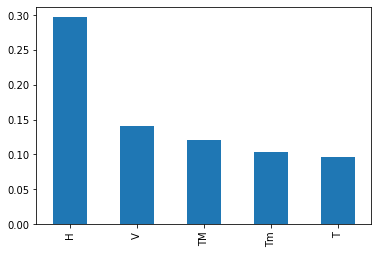

In [25]:
pd.Series(feature_selector.feature_importances_, index=X.columns).nlargest(5).plot(kind='bar')

/home/fish/.local/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM_2_5', ylabel='Density'>

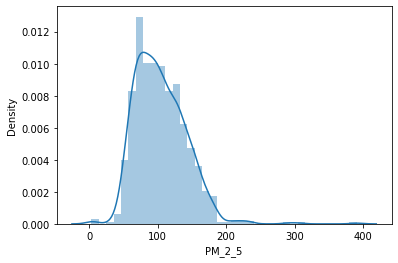

In [26]:
sns.distplot(y)

In [27]:
combined_data.to_csv('data/combined_data/cleaned_data.csv', index=None)